# Final

## Feb

## Data Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px
from pytrends.request import TrendReq
trends = TrendReq()

In [2]:
#Importing Dataset using pandas
data1 = pd.read_csv("DataCoSupplyChainDataset.csv", encoding='latin-1')
data1.head()# Checking 5 rows in dataset

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [3]:
def initial_EDA():
    print("Summary \n\n", data1.info())
    print("\n--------------------------------------------\n")
    print("Shape\n\n", data1.shape)
    print("\n--------------------------------------------\n")
    print("Data Types\n\n", data1.dtypes)
    print("\n--------------------------------------------\n")
    print("Any Duplicate Values?\n\n", data1.duplicated().sum())
    print("\n--------------------------------------------\n")
    print("Empty Values Total \n\n", data1.isnull().sum())
    print("\n--------------------------------------------\n")
    print("Non-empty values Total \n\n", data1.notnull().sum())
    print("\n--------------------------------------------\n")
    print("Columns names\n\n", data1.columns)
    print("\n--------------------------------------------\n")
    print("Unique Values\n\n", data1.nunique())
    print("\n--------------------------------------------\n")
initial_EDA()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

Unique Values

 Type                                  4
Days for shipping (real)              7
Days for shipment (scheduled)         4
Benefit per order                 21998
Sales per customer                 2927
Delivery Status                       4
Late_delivery_risk                    2
Category Id                          51
Category Name                        50
Customer City                       563
Customer Country                      2
Customer Email                        1
Customer Fname                      782
Customer Id                       20652
Customer Lname                     1109
Customer Password                     1
Customer Segment                      3
Customer State                       46
Customer Street                    7458
Customer Zipcode                    995
Department Id                        11
Department Name                      11
Latitude                          11250
Longitude                          4487
Market                  

[Text(0.5, 23.859374999999986, 'Columns'),
 Text(56.0, 0.5, 'Null Values'),
 Text(0.5, 1.0, 'Heatmap of null values in the data')]

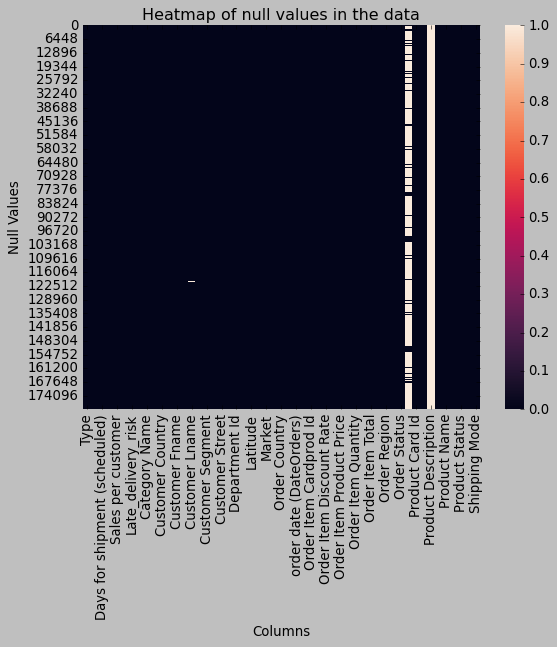

In [30]:
s = sns.heatmap(data1.isnull())
s.set(xlabel='Columns', ylabel='Null Values', title = 'Heatmap of null values in the data')

C:\Users\rohan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


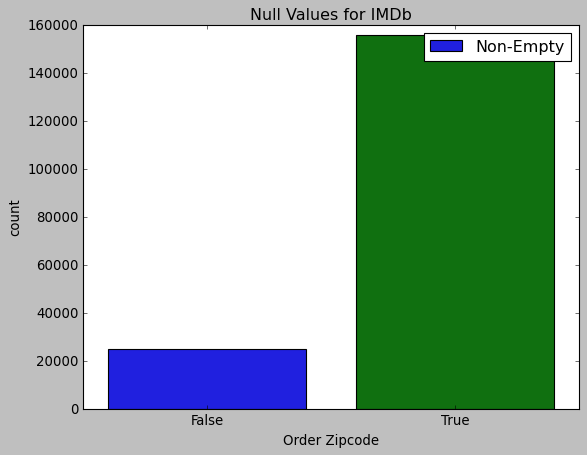

In [31]:
s1 = sns.countplot(data1['Order Zipcode'].isnull())
s1.set(title = 'Null Values for IMDb')
s1.legend(labels = ['Non-Empty', 'Empty'])
s1.legend(labels = ['Non-Empty', 'Empty'])

In [11]:
def data_info(data1):
    print('1) Number of columns are : ',data1.shape[1])
    print('2) Number of rows are : ',data1.shape[0])
    print('3) Total number of data-points :',data1.size)
    numerical_features = [f for f in data1.columns if data1[f].dtypes!='O']
    print('4) Count of Numerical Features :',len(numerical_features))
    #cat_features = [c for c in data.columns if data1[c].dtypes=='O']
    #print('5) Count of Categorical Features :',len(cat_features))
data_info(data1)

1) Number of columns are :  53
2) Number of rows are :  180519
3) Total number of data-points : 9567507
4) Count of Numerical Features : 29


In [8]:
def features_with_missing_values(data1):
    x = data1.isnull().sum().sum()/(data1.shape[0]*data1.shape[1])*100
    print('Percentage of Total Missing Values is ' ,round(x,2) ,'%')
    print('Missing Value Estimation :')
    for i in data1.columns:
        if data1[i].isna().sum()>0:
            print('The Feature ',i,' has '+ str(data1[i].isna().sum()) + ' missing values')            
features_with_missing_values(data1)

Percentage of Total Missing Values is  3.51 %
Missing Value Estimation :
The Feature  Customer Lname  has 8 missing values
The Feature  Customer Zipcode  has 3 missing values
The Feature  Order Zipcode  has 155679 missing values
The Feature  Product Description  has 180519 missing values


<AxesSubplot:>

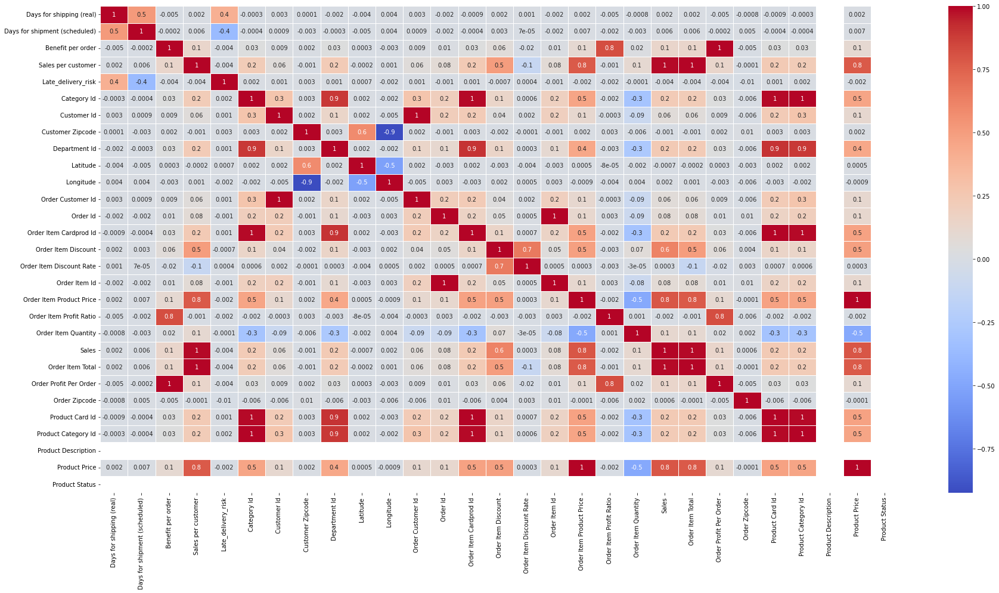

In [9]:
fig, ax = plt.subplots(figsize=(30,15))         # figure size
sns.heatmap(data1.corr(), annot=True, linewidths=0.5, fmt='.1g', cmap= 'coolwarm') # Heatmap for correlation matrix

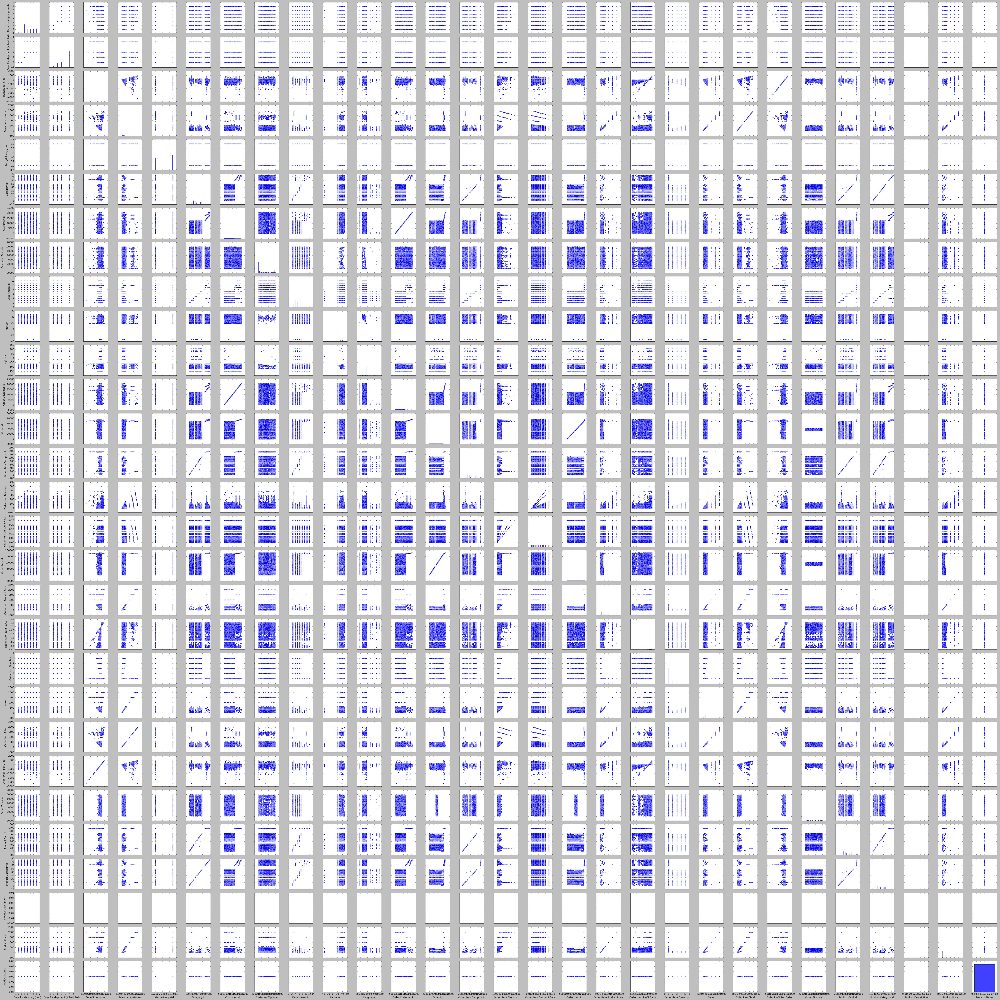

In [18]:
sns.pairplot(data1)

In [3]:
data = data1.drop(['Customer Email','Customer Id','Customer Lname','Customer Password','Customer Zipcode',
          'Order Customer Id','Order Id','Order Item Id','Order Zipcode','Product Card Id',
          'Product Description','Product Image','Order Item Product Price',
          'Product Status','Order Profit Per Order'],axis = 1)
data.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Sales,Order Item Total,Order Region,Order State,Order Status,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,327.75,314.640015,Southeast Asia,Java Occidental,COMPLETE,73,Smart watch,327.75,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,327.75,311.359985,South Asia,Rajastán,PENDING,73,Smart watch,327.75,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,327.75,309.720001,South Asia,Rajastán,CLOSED,73,Smart watch,327.75,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,327.75,304.809998,Oceania,Queensland,COMPLETE,73,Smart watch,327.75,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,327.75,298.250000,Oceania,Queensland,PENDING_PAYMENT,73,Smart watch,327.75,1/15/2018 11:24,Standard Class


# Countplot

C:\Users\rohan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


[Text(0.5, 1.0, 'Bar graph of Shipping Mode')]

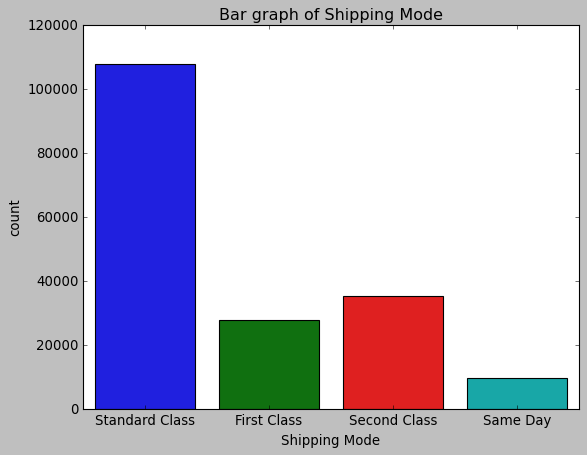

In [47]:
s1 = sns.countplot(data['Shipping Mode'])
s1.set(title = 'Bar graph of Shipping Mode')

C:\Users\rohan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


[Text(0.5, 1.0, 'Bar graph of Type')]

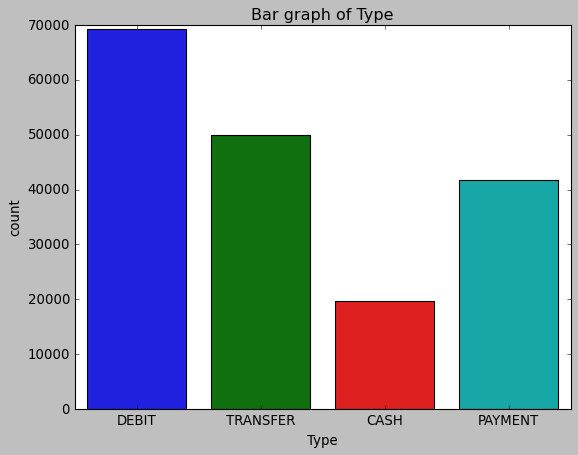

In [16]:
s4 = sns.countplot(data['Type'])
s4.set(title = 'Bar graph of Type')

In [11]:
figure = px.pie(data, values = 'Days for shipping (real)',names = 'Type', title='Pie chart of Types', hole=0.5)
figure.show()

# One Hot Encoding

In [13]:
top_4 = [x for x in data.Type.value_counts().sort_values(ascending=False).index]
top_4

['DEBIT', 'TRANSFER', 'PAYMENT', 'CASH']

In [14]:
for label in top_4:
    data[label] = np.where(data['Type'] == label, 1, 0)
data[['Type']+top_4].head(20)
# data['DEBIT'] = np.where(data['Type']=='DEBIT',1,0)
# data['TRANSFER'] = np.where(data['Type']=='TRANSFER',1,0)
# data['PAYMENT'] = np.where(data['Type']=='PAYMENT',1,0)
# data['CASH'] = np.where(data['Type']=='CASH',1,0)

# data.drop[colums = ['Type'],axis = 1,inplace= True ]

,Type,DEBIT,TRANSFER,PAYMENT,CASH
0,DEBIT,1,0,0,0
1,TRANSFER,0,1,0,0
2,CASH,0,0,0,1
3,DEBIT,1,0,0,0
4,PAYMENT,0,0,1,0
5,TRANSFER,0,1,0,0
6,DEBIT,1,0,0,0
7,TRANSFER,0,1,0,0
8,CASH,0,0,0,1
9,CASH,0,0,0,1


In [15]:
def one_hot_top_IV(data,Type,top_IV_labels):
    for label in top_4:
        data[label] = np.where(data['Type'] == label, 1, 0)
one_hot_top_IV(data,'Type',top_4)
#data2 = data.drop(['Type'],axis=1)
data.head(20)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,DEBIT,TRANSFER,PAYMENT,CASH
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class,1,0,0,0
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class,0,1,0,0
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class,0,0,0,1
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class,1,0,0,0
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class,0,0,1,0
5,TRANSFER,6,4,18.580000,294.980011,Shipping canceled,0,73,Sporting Goods,Tonawanda,...,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/19/2018 11:03,Standard Class,0,1,0,0
6,DEBIT,2,1,95.180000,288.420013,Late delivery,1,73,Sporting Goods,Caguas,...,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 10:42,First Class,1,0,0,0
7,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,73,Sporting Goods,Miami,...,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 10:21,First Class,0,1,0,0
8,CASH,3,2,133.720001,278.589996,Late delivery,1,73,Sporting Goods,Caguas,...,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 10:00,Second Class,0,0,0,1
9,CASH,2,1,132.149994,275.309998,Late delivery,1,73,Sporting Goods,San Ramon,...,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 9:39,First Class,0,0,0,1


# Current Trend

In [24]:
trends.build_payload(kw_list=["E-commerce"])
data = trends.interest_by_region()
data = data.sort_values(by="E-commerce", ascending=False)
data = data.head(20)
print(data)

               E-commerce
geoName                  
Benin                 100
Cameroon               61
China                  54
Ethiopia               52
Zimbabwe               49
Côte d’Ivoire          45
Kenya                  35
Ghana                  34
Senegal                34
Nepal                  32
Morocco                31
Bangladesh             31
Nigeria                30
Tanzania               29
Philippines            28
Indonesia              26
Uganda                 25
Singapore              25
Tunisia                25
Malaysia               24


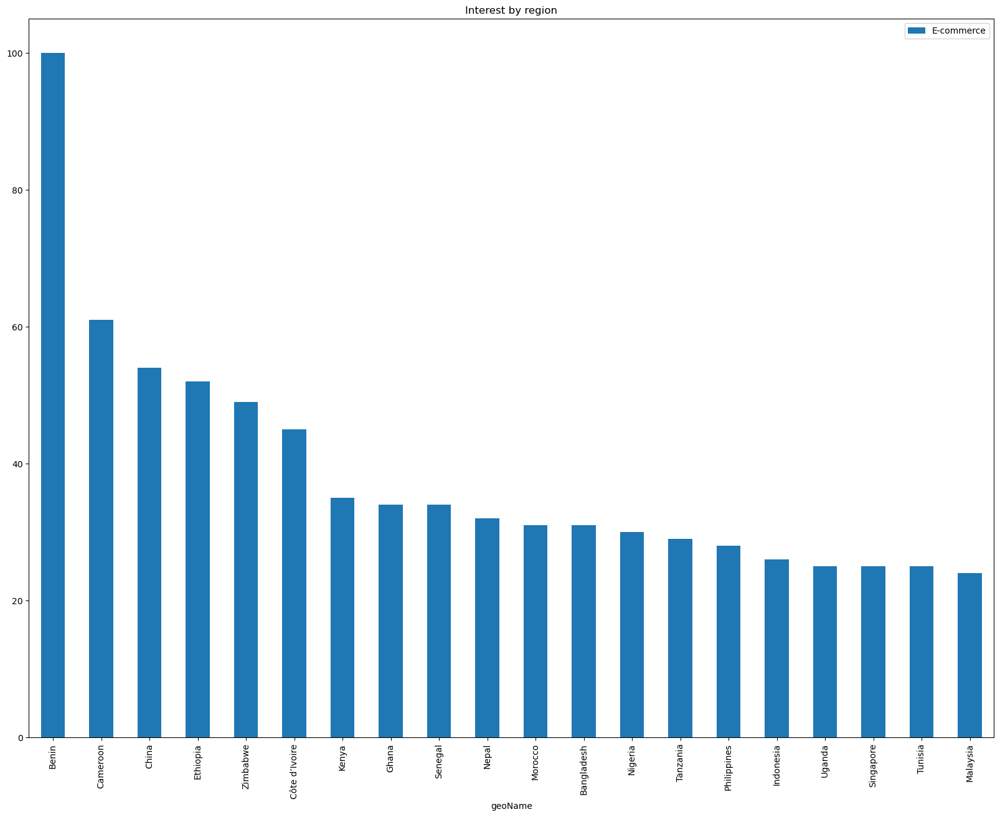

In [25]:
data.reset_index().plot(x="geoName", y="E-commerce", figsize=(20,15), kind="bar", title = 'Interest by region')
plt.style.use('classic')
plt.show()

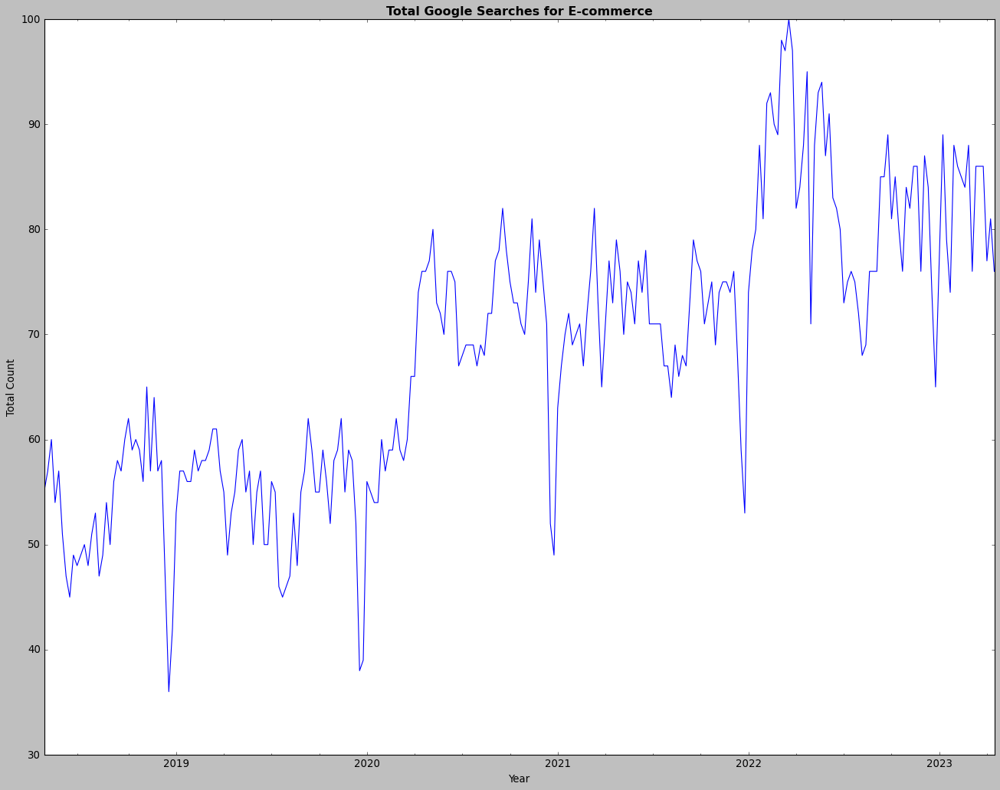

In [26]:
data = TrendReq(hl="en-US", tz=360)
data.build_payload(kw_list=['E-commerce'])
data = data.interest_over_time()
fig,ax = plt.subplots(figsize = (20,15))
data['E-commerce'].plot()
plt.style.use("classic")
plt.title('Total Google Searches for E-commerce', fontweight='bold')
plt.xlabel('Year')
plt.ylabel('Total Count')
plt.show()

In [19]:
#sns.kdeplot(data['Benefit per order'], bw = 1)

# Country Count

In [10]:
a = data['Order Country'].value_counts().head(10)
a

Estados Unidos    24840
Francia           13222
México            13172
Alemania           9564
Australia          8497
Brasil             7987
Reino Unido        7302
China              5758
Italia             4989
India              4783
Name: Order Country, dtype: int64

<AxesSubplot:>

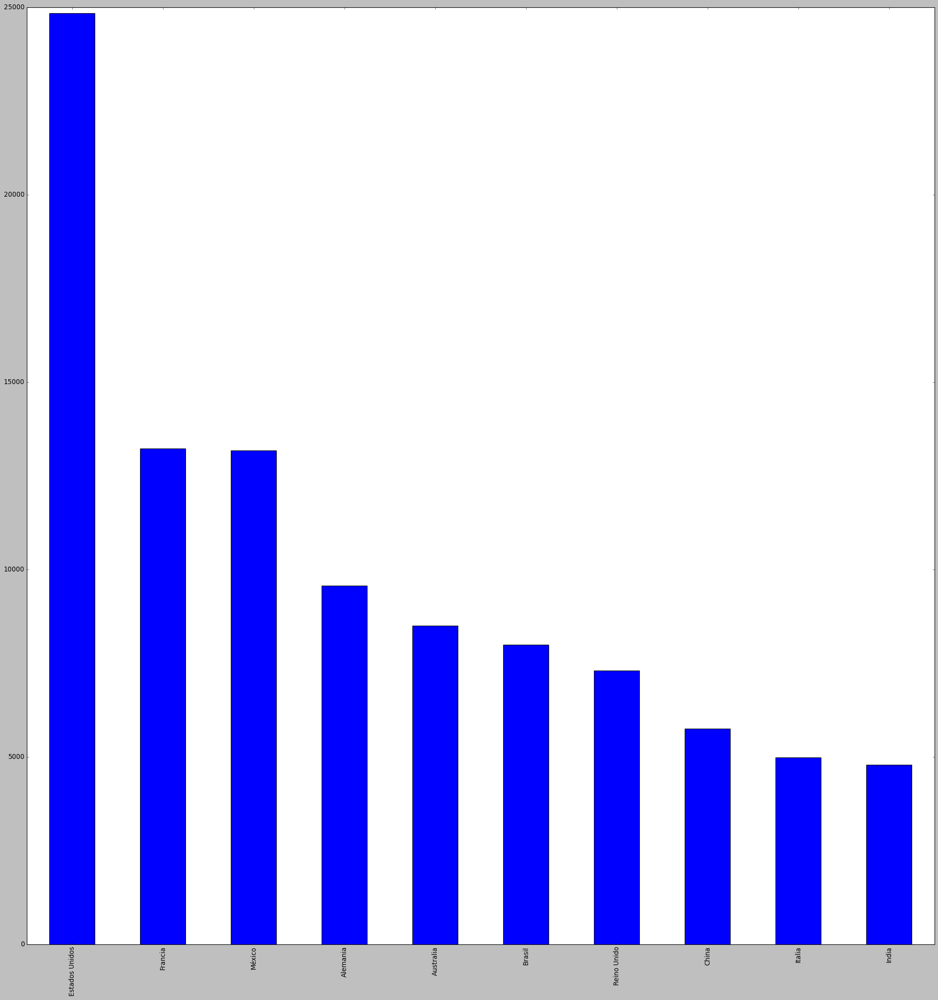

In [17]:
c = data["Order Country"].value_counts().head(10)
c.plot(kind="bar",figsize=(30,30))

In [39]:
data.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Sales,Order Item Total,Order Region,Order State,Order Status,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,327.75,314.640015,Southeast Asia,Java Occidental,COMPLETE,73,Smart watch,327.75,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,327.75,311.359985,South Asia,Rajastán,PENDING,73,Smart watch,327.75,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,327.75,309.720001,South Asia,Rajastán,CLOSED,73,Smart watch,327.75,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,327.75,304.809998,Oceania,Queensland,COMPLETE,73,Smart watch,327.75,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,327.75,298.250000,Oceania,Queensland,PENDING_PAYMENT,73,Smart watch,327.75,1/15/2018 11:24,Standard Class


In [144]:
data['Market'].value_counts()

LATAM           51594
Europe          50252
Pacific Asia    41260
USCA            25799
Africa          11614
Name: Market, dtype: int64

C:\Users\rohan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


[Text(0.5, 1.0, 'Bar graph of Market')]

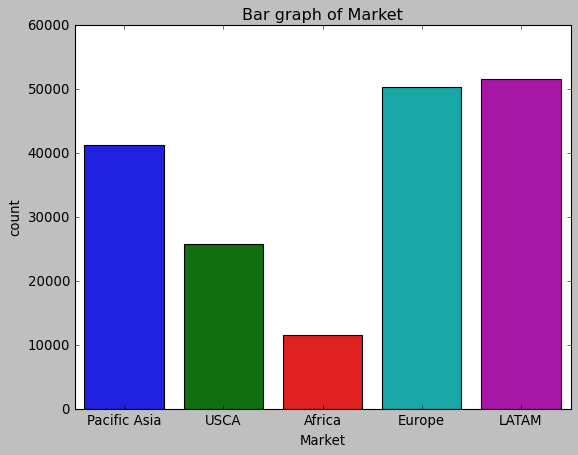

In [145]:
s2 = sns.countplot(data['Market'])
s2.set(title = 'Bar graph of Market')

In [37]:
data1.dtypes

Type                              object
Days for shipping (real)           int64
Days for shipment (scheduled)      int64
Benefit per order                float64
Sales per customer               float64
Delivery Status                   object
Late_delivery_risk                 int64
Category Id                        int64
Category Name                     object
Customer City                     object
Customer Country                  object
Customer Email                    object
Customer Fname                    object
Customer Id                        int64
Customer Lname                    object
Customer Password                 object
Customer Segment                  object
Customer State                    object
Customer Street                   object
Customer Zipcode                 float64
Department Id                      int64
Department Name                   object
Latitude                         float64
Longitude                        float64
Market          

In [38]:
data1['Date'] = pd.to_datetime(data1['shipping date (DateOrders)'])
data1.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,Date
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class,2018-02-03 22:56:00
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class,2018-01-18 12:27:00
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class,2018-01-17 12:06:00
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class,2018-01-16 11:45:00
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class,2018-01-15 11:24:00


In [48]:
data1['date'] = data1['Date'].dt.date
data1['time'] = data1['Date'].dt.time
data1.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,Date,date,time,Year,Month,Day
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,327.75,0,2/3/2018 22:56,Standard Class,2018-02-03,2018-02-03,00:00:00,2018,2,3
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,327.75,0,1/18/2018 12:27,Standard Class,2018-01-18,2018-01-18,00:00:00,2018,1,18
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,327.75,0,1/17/2018 12:06,Standard Class,2018-01-17,2018-01-17,00:00:00,2018,1,17
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,327.75,0,1/16/2018 11:45,Standard Class,2018-01-16,2018-01-16,00:00:00,2018,1,16
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,327.75,0,1/15/2018 11:24,Standard Class,2018-01-15,2018-01-15,00:00:00,2018,1,15


In [49]:
data1['Year'] = data1['Date'].dt.year
data1['Month'] = data1['Date'].dt.month
data1['Day'] = data1['Date'].dt.day
data1.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,Date,date,time,Year,Month,Day
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,327.75,0,2/3/2018 22:56,Standard Class,2018-02-03,2018-02-03,00:00:00,2018,2,3
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,327.75,0,1/18/2018 12:27,Standard Class,2018-01-18,2018-01-18,00:00:00,2018,1,18
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,327.75,0,1/17/2018 12:06,Standard Class,2018-01-17,2018-01-17,00:00:00,2018,1,17
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,327.75,0,1/16/2018 11:45,Standard Class,2018-01-16,2018-01-16,00:00:00,2018,1,16
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,327.75,0,1/15/2018 11:24,Standard Class,2018-01-15,2018-01-15,00:00:00,2018,1,15


In [50]:
data1['Year'].value_counts()

2016    62602
2015    62002
2017    53546
2018     2369
Name: Year, dtype: int64

[Text(0.5, 1.0, 'Bar graph of Year')]

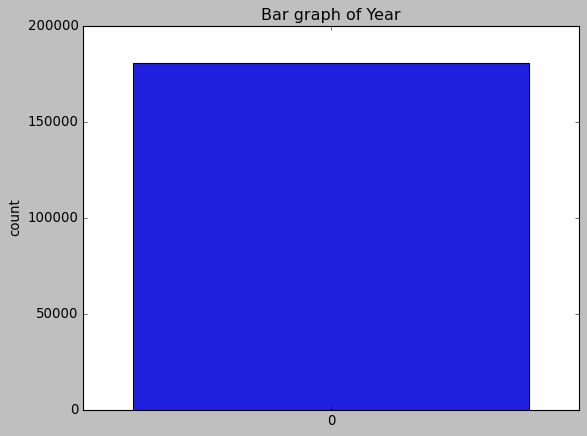

In [53]:
s3 = sns.countplot(data1['Year'])
s3.set(title = 'Bar graph of Year')

# March

# Machine Learning

## Linear Regression

In [16]:
X=np.array(data['Days for shipment (scheduled)'])
Y=np.array(data['Days for shipping (real)'])

In [5]:
X.shape,Y.shape

((180519,), (180519,))

In [35]:
#X=np.array(data['Order Item Total'])
#Y=np.array(data['Benefit per order'])

In [138]:
#X=np.array(data['Product Price'])
#Y=np.array(data['Order Item Discount Rate'])

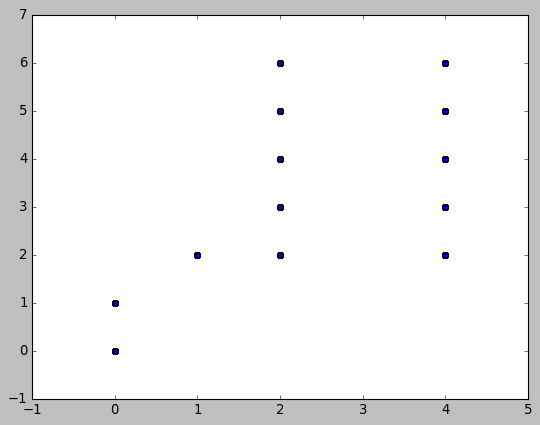

In [34]:
plt.scatter(X,Y)

In [17]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,Y, test_size=0.2,random_state=23)

In [18]:
X_train.shape

(144415,)

In [19]:
X_test.shape

(36104,)

In [20]:
X_train = np.array(X_train).reshape(-1,1)
X_test = np.array(X_test).reshape(-1,1)

In [21]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train,Y_train)

LinearRegression()

In [22]:
c = lr.intercept_
m = lr.coef_
print(c)
print(m)

1.7133615209388027
[0.60748688]


In [23]:
Y_Pred_train1 = lr.predict(X_train)
Y_Pred_train1
#Y_Pred_train = m*X_train + c
#Y_Pred_train.flatten()

array([4.14330904, 4.14330904, 2.3208484 , ..., 4.14330904, 4.14330904,
       4.14330904])

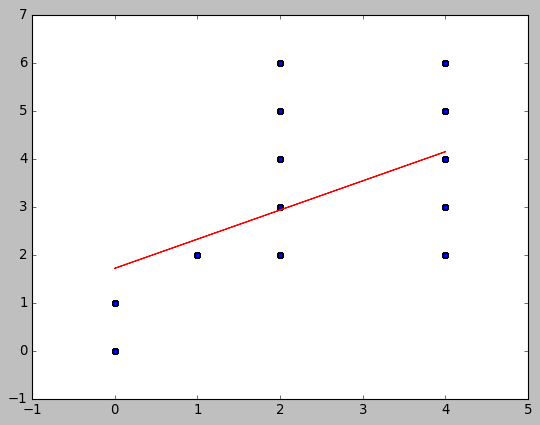

In [42]:
plt.scatter(X_train, Y_train)
plt.plot(X_train, Y_Pred_train1, color='Red')

In [24]:
Y_Pred_test1 = lr.predict(X_test)
Y_Pred_test1

array([2.92833528, 4.14330904, 4.14330904, ..., 2.3208484 , 4.14330904,
       4.14330904])

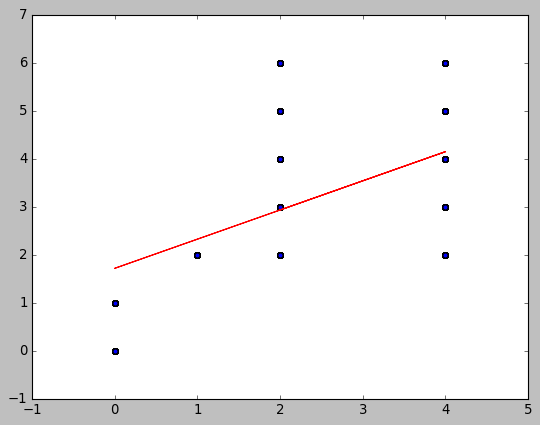

In [44]:
plt.scatter(X_test, Y_test)
plt.plot(X_test, Y_Pred_test1, color='Red')

In [25]:
from sklearn.metrics import roc_auc_score,r2_score,mean_absolute_error,mean_squared_error,accuracy_score,classification_report,confusion_matrix

In [26]:
a =r2_score(Y_test,Y_Pred_test1)
b =mean_squared_error(Y_test,Y_Pred_test1)
c =mean_absolute_error(Y_test,Y_Pred_test1)
print('The r-squared score of the model is ',a)
print('The mean squared error is',b)
print('The mean accuracy score is',c)

The r-squared score of the model is  0.27245040984059643
The mean squared error is 1.9380089710193182
The mean accuracy score is 1.1316582721579302


# K-Means Clustering

In [251]:
from sklearn.datasets import make_blobs

In [30]:
dataset = make_blobs(n_samples = 200,
                    centers = 4,
                    n_features = 2,
                    random_state = 50)

In [31]:
points1 = dataset[0]

In [32]:
from sklearn.cluster import KMeans

In [61]:
kmeans = KMeans(n_clusters=4)

In [63]:
kmeans.fit(points1)

KMeans(n_clusters=4)

In [64]:
clusters = kmeans.cluster_centers_

In [65]:
print(clusters)

[[-5.07407665 -2.22954938]
 [-2.44303075  9.96023082]
 [ 0.06648672 -5.5003522 ]
 [-1.83542556  5.27815404]]


In [66]:
points1.shape

(200, 2)

In [67]:
y_km = kmeans.fit_predict(points1)

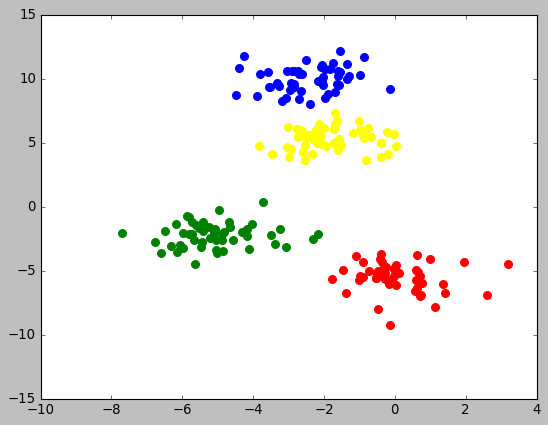

In [68]:
plt.scatter(points1[y_km == 0,0],points1[y_km == 0,1 ],s=50,color='red')
plt.scatter(points1[y_km == 1,0],points1[y_km == 1,1 ],s=50,color='blue')
plt.scatter(points1[y_km == 2,0],points1[y_km == 2,1 ],s=50,color='green')
plt.scatter(points1[y_km == 3,0],points1[y_km == 3,1 ],s=50,color='yellow')

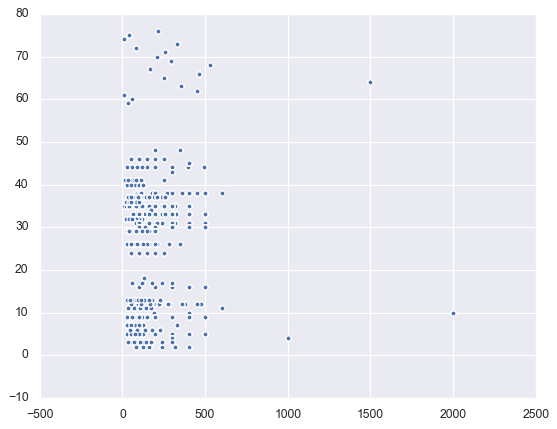

In [250]:
plt.scatter(data['Sales'],data['Category Id'])
plt.show()

In [54]:
from sklearn.datasets import make_blobs
x = np.array([data['Sales'],data['Category Id']])
x.shape

(2, 180519)

In [55]:
x = x.T

In [56]:
x.shape

(180519, 2)

In [57]:
points = x

In [58]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4)
kmeans.fit(points)
clusters = kmeans.cluster_centers_

C:\Users\rohan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [59]:
clusters

array([[ 102.325844  ,   27.19300169],
       [ 238.89791387,   34.27710591],
       [ 412.76245418,   39.71394183],
       [1505.35278319,   60.98072805]])

In [60]:
y_km = kmeans.predict(points)

In [61]:
y_km

array([2, 2, 2, ..., 2, 2, 2])

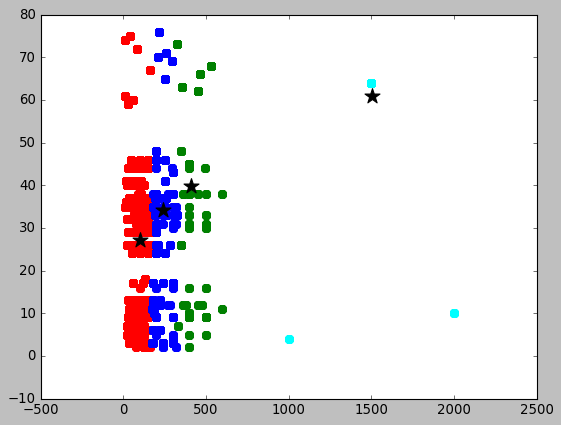

In [62]:
plt.scatter(points[y_km == 0,0],points[y_km == 0,1 ],s=50,color='red')
plt.scatter(points[y_km == 1,0],points[y_km == 1,1 ],s=50,color='blue')
plt.scatter(points[y_km == 2,0],points[y_km == 2,1 ],s=50,color='green')
plt.scatter(points[y_km == 3,0],points[y_km == 3,1 ],s=50,color='cyan')

plt.scatter(clusters[0][0], clusters[0][1],marker = '*', s=200, color='black')
plt.scatter(clusters[1][0], clusters[1][1],marker = '*', s=200, color='black')
plt.scatter(clusters[2][0], clusters[2][1],marker = '*', s=200, color='black')
plt.scatter(clusters[3][0], clusters[3][1],marker = '*', s=200, color='black')

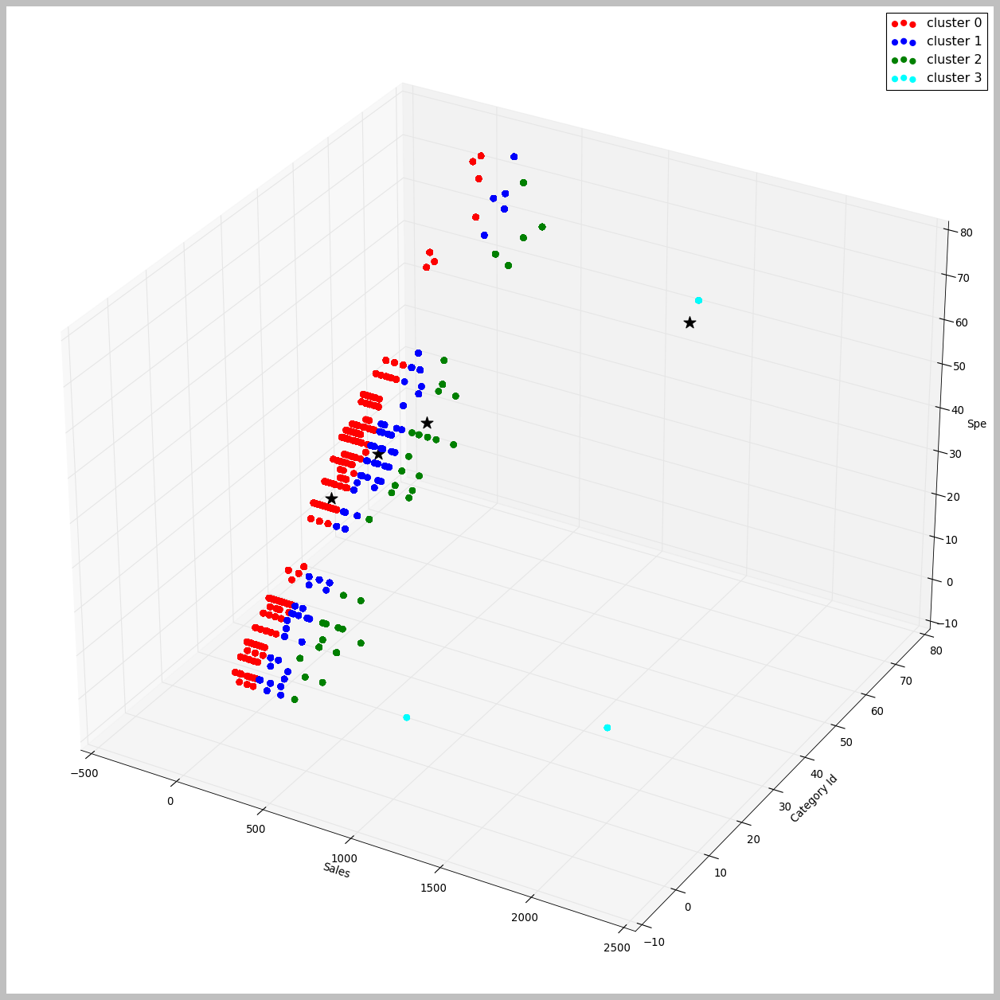

In [65]:
fig = plt.figure(figsize = (20,20))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(points[y_km == 0,0],points[y_km == 0,1],points[y_km == 0,1], s = 40 , color = 'red', label = "cluster 0")
ax.scatter(points[y_km == 1,0],points[y_km == 1,1],points[y_km == 1,1], s = 40 , color = 'blue', label = "cluster 1")
ax.scatter(points[y_km == 2,0],points[y_km == 2,1],points[y_km == 2,1], s = 40 , color = 'green', label = "cluster 2")
ax.scatter(points[y_km == 3,0],points[y_km == 3,1],points[y_km == 3,1], s = 40 , color = 'cyan', label = "cluster 3")

ax.scatter(clusters[0][0], clusters[0][1], clusters[0][1],marker = '*', s=200, color='black')
ax.scatter(clusters[1][0], clusters[1][1], clusters[1][1],marker = '*', s=200, color='black')
ax.scatter(clusters[2][0], clusters[2][1], clusters[2][1],marker = '*', s=200, color='black')
ax.scatter(clusters[3][0], clusters[3][1], clusters[3][1],marker = '*', s=200, color='black')

ax.set_xlabel('Sales')
ax.set_ylabel('Category Id')
ax.set_zlabel('Spe')
ax.legend()
plt.show()

# April

# Machine Learning

## Multiple Regression

### Forward propagation

In [66]:
# Converting the categorical features into numeric using one-hot encoding
# Features 'Xi'

# X1
data1['Type'] = data1['Type'].astype('category')
data1['Type'] = data1['Type'].cat.codes  # 0 = CASH, 1 = DEBIT, 2 = PAYMENT, 3 = TRANSFER

# X2
data1['Shipping Mode'] = data1['Shipping Mode'].astype('category')
data1['Shipping Mode'] = data1['Shipping Mode'].cat.codes  # 0 = First Class, 1 = Same Day, 2 = Second Class, 3 = Standard Class

# X3
# x3 = "Order Item Product Price"

# X4
data1['Customer Segment'] = data1['Customer Segment'].astype('category')
data1['Customer Segment'] = data1['Customer Segment'].cat.codes  # 0 = Consumer, 1 = Corporate, 2 = Home Office

# X5
data1['Market'] = data1['Market'].astype('category')
data1['Market'] = data1['Market'].cat.codes  # 0 = Africa, 1 = Europe, 2 = LATAM, 3 = Pacific Asia, 4 = USCA 

In [67]:
data['Market'].value_counts()

LATAM           51594
Europe          50252
Pacific Asia    41260
USCA            25799
Africa          11614
Name: Market, dtype: int64

In [68]:
data1['Market'].value_counts()

2    51594
1    50252
3    41260
4    25799
0    11614
Name: Market, dtype: int64

### For two variables 

RMSE: 119.35100597964018


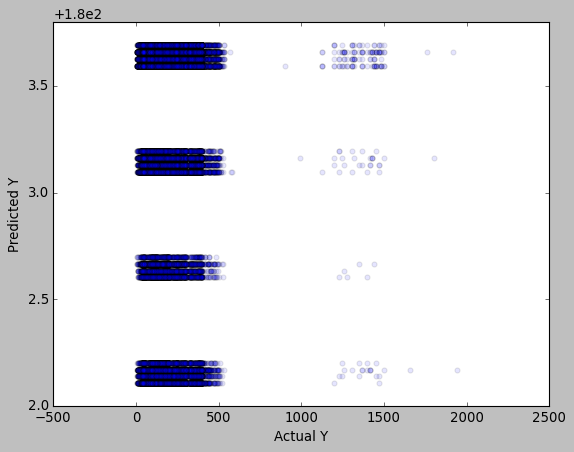

Intercept:  182.20379048295362
Coefficients:  [-0.03271108  0.49670225]


In [69]:
# Import required libraries
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error


# Randomly select 108312 rows as the training dataset
train_data = data1.sample(n=108312)

# Select the remaining rows as the test dataset
test_data = data1.loc[~data.index.isin(train_data.index)]


# Extract the target variable and features for the training dataset
Y_train = train_data["Sales per customer"]  # Target Varible is Y = Delivery Status
X_train = train_data[["Type", "Shipping Mode"]]  # Type, Shipping Mode, Product Price are the features that we are considering

# Extract the target variable and features for the test dataset
Y_test = test_data["Sales per customer"]
X_test = test_data[["Type", "Shipping Mode"]]


# Create an instance of the linear regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred = model.predict(X_test)


# Calculate the RMSE error
rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
print("RMSE:", rmse)

# Plot the actual Y vs predicted Y graph
plt.scatter(Y_test, Y_pred, alpha=0.1)
plt.xlabel("Actual Y")
plt.ylabel("Predicted Y")
plt.show()

# Print the intercept and coefficients
print("Intercept: ", model.intercept_)
print("Coefficients: ", model.coef_)

### For three variables

RMSE: 74.64343500332062


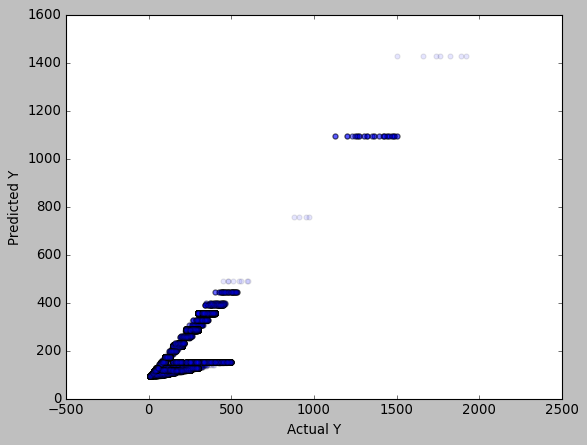

Intercept:  87.6340819246709
Coefficients:  [0.31516326 0.07586229 0.67115266]


In [70]:
# Randomly select 108312 rows as the training dataset
train_data = data1.sample(n=108312)

# Select the remaining rows as the test dataset
test_data = data1.loc[~data.index.isin(train_data.index)]


# Extract the target variable and features for the training dataset
Y_train = train_data["Sales per customer"]  # Target Varible is Y = Delivery Status
X_train = train_data[["Type", "Shipping Mode", "Order Item Product Price"]]  # Type, Shipping Mode, Product Price are the features that we are considering

# Extract the target variable and features for the test dataset
Y_test = test_data["Sales per customer"]
X_test = test_data[["Type", "Shipping Mode", "Order Item Product Price"]]


# Create an instance of the linear regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred = model.predict(X_test)


# Calculate the RMSE error
rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
print("RMSE:", rmse)

# Plot the actual Y vs predicted Y graph
plt.scatter(Y_test, Y_pred, alpha=0.1)
plt.xlabel("Actual Y")
plt.ylabel("Predicted Y")
plt.show()

# Print the intercept and coefficients
print("Intercept: ", model.intercept_)
print("Coefficients: ", model.coef_)

### For four variables

RMSE: 74.69596837916554


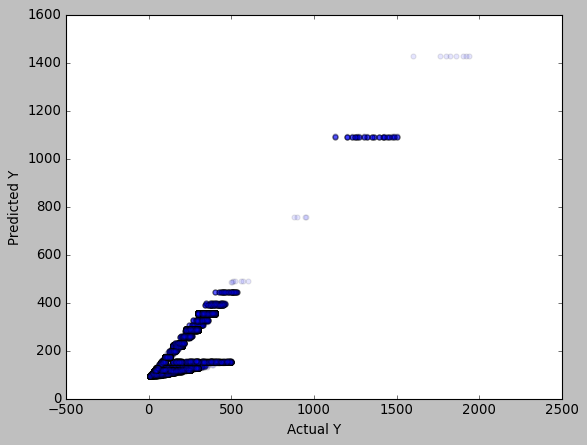

Intercept:  88.41719169578555
Coefficients:  [ 0.2022299   0.10882606  0.66963196 -0.60774996]


In [71]:
# Randomly select 108312 rows as the training dataset
train_data = data1.sample(n=108312)

# Select the remaining rows as the test dataset
test_data = data1.loc[~data.index.isin(train_data.index)]


# Extract the target variable and features for the training dataset
Y_train = train_data["Sales per customer"]  # Target Varible is Y = Delivery Status
X_train = train_data[["Type", "Shipping Mode", "Order Item Product Price", 'Customer Segment']]  # Type, Shipping Mode, Product Price are the features that we are considering

# Extract the target variable and features for the test dataset
Y_test = test_data["Sales per customer"]
X_test = test_data[["Type", "Shipping Mode", "Order Item Product Price", 'Customer Segment']]


# Create an instance of the linear regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred = model.predict(X_test)


# Calculate the RMSE error
rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
print("RMSE:", rmse)

# Plot the actual Y vs predicted Y graph
plt.scatter(Y_test, Y_pred, alpha=0.1)
plt.xlabel("Actual Y")
plt.ylabel("Predicted Y")
plt.show()

# Print the intercept and coefficients
print("Intercept: ", model.intercept_)
print("Coefficients: ", model.coef_)

### For five variables

RMSE: 75.25771648027452


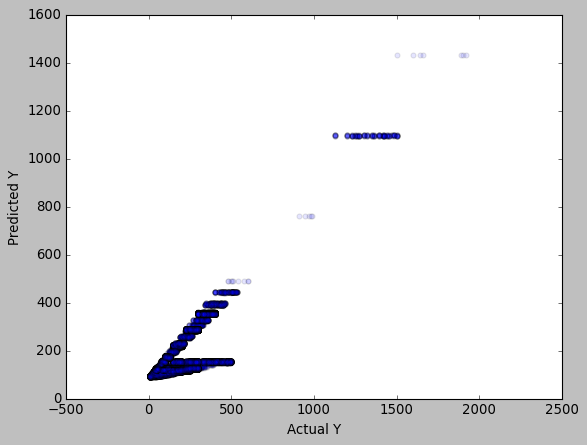

Intercept:  91.18236033836673
Coefficients:  [ 0.13747817  0.05977358  0.6721882  -0.60390002 -1.49870845]


In [72]:
# Randomly select 108312 rows as the training dataset
train_data = data1.sample(n=108312)

# Select the remaining rows as the test dataset
test_data = data1.loc[~data.index.isin(train_data.index)]


# Extract the target variable and features for the training dataset
Y_train = train_data["Sales per customer"]  # Target Varible is Y = Delivery Status
X_train = train_data[["Type", "Shipping Mode", "Order Item Product Price", 'Customer Segment', 'Market']]  # Type, Shipping Mode, Product Price are the features that we are considering

# Extract the target variable and features for the test dataset
Y_test = test_data["Sales per customer"]
X_test = test_data[["Type", "Shipping Mode", "Order Item Product Price", 'Customer Segment', 'Market']]


# Create an instance of the linear regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred = model.predict(X_test)


# Calculate the RMSE error
rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
print("RMSE:", rmse)

# Plot the actual Y vs predicted Y graph
plt.scatter(Y_test, Y_pred, alpha=0.1)
plt.xlabel("Actual Y")
plt.ylabel("Predicted Y")
plt.show()

# Print the intercept and coefficients
print("Intercept: ", model.intercept_)
print("Coefficients: ", model.coef_)

In [73]:
# Target variable
data1['Delivery Status'] = data1['Delivery Status'].astype('category')
data1['Delivery Status'] = data1['Delivery Status'].cat.codes # 0 = Advanced shipping, 1 = Late delivery, 2 = Shipping cancelled ,3 = Shipping on time

In [74]:
Y = data["Delivery Status"].head(10812)
Y

0        Advance shipping
1           Late delivery
2        Shipping on time
3        Advance shipping
4        Advance shipping
               ...       
10807       Late delivery
10808       Late delivery
10809       Late delivery
10810       Late delivery
10811       Late delivery
Name: Delivery Status, Length: 10812, dtype: object

RMSE: 74.62331089190286


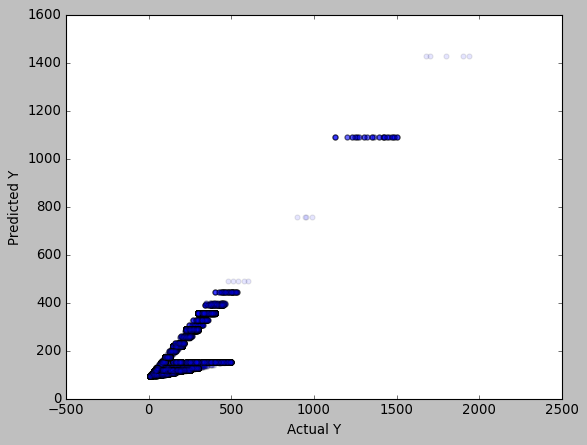

Intercept:  88.31931301799128
Coefficients:  [0.08652332 0.11985849 0.66983915]


In [75]:
# Import required libraries
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error


# Randomly select 108312 rows as the training dataset
train_data = data1.sample(n=108312)

# Select the remaining rows as the test dataset
test_data = data1.loc[~data.index.isin(train_data.index)]


# Extract the target variable and features for the training dataset
Y_train = train_data["Sales per customer"]  # Target Varible is Y = Delivery Status
X_train = train_data[["Type", "Shipping Mode", "Order Item Product Price"]]  # Type, Shipping Mode, Product Price are the features that we are considering

# Extract the target variable and features for the test dataset
Y_test = test_data["Sales per customer"]
X_test = test_data[["Type", "Shipping Mode", "Order Item Product Price"]]


# Create an instance of the linear regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred = model.predict(X_test)


# Calculate the RMSE error
rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
print("RMSE:", rmse)

# Plot the actual Y vs predicted Y graph
plt.scatter(Y_test, Y_pred, alpha=0.1)
plt.xlabel("Actual Y")
plt.ylabel("Predicted Y")
plt.show()

# Print the intercept and coefficients
print("Intercept: ", model.intercept_)
print("Coefficients: ", model.coef_)

# 3D cluster

In [76]:
data.columns

Index(['Type', 'Days for shipping (real)', 'Days for shipment (scheduled)',
       'Benefit per order', 'Sales per customer', 'Delivery Status',
       'Late_delivery_risk', 'Category Id', 'Category Name', 'Customer City',
       'Customer Country', 'Customer Fname', 'Customer Segment',
       'Customer State', 'Customer Street', 'Department Id', 'Department Name',
       'Latitude', 'Longitude', 'Market', 'Order City', 'Order Country',
       'order date (DateOrders)', 'Order Item Cardprod Id',
       'Order Item Discount', 'Order Item Discount Rate',
       'Order Item Profit Ratio', 'Order Item Quantity', 'Sales',
       'Order Item Total', 'Order Region', 'Order State', 'Order Status',
       'Product Category Id', 'Product Name', 'Product Price',
       'shipping date (DateOrders)', 'Shipping Mode', 'Date', 'date', 'time',
       'Year', 'Month', 'Day'],
      dtype='object')

In [77]:
data['Type'] = data['Type'].astype('category')
data['Type'] = data['Type'].cat.codes

data['Shipping Mode'] = data['Shipping Mode'].astype('category')
data['Shipping Mode'] = data['Shipping Mode'].cat.codes

data['Customer Segment'] = data['Customer Segment'].astype('category')
data['Customer Segment'] = data['Customer Segment'].cat.codes

In [78]:
from sklearn.datasets import make_blobs
x = np.array([data['Type'],data['Shipping Mode'],data['Customer Segment']])
x.shape

(3, 180519)

In [79]:
x = x.T
x.shape

(180519, 3)

In [80]:
points = x

In [81]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4)
kmeans.fit(points)
clusters = kmeans.cluster_centers_

C:\Users\rohan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [82]:
clusters

array([[1.70237   , 0.24749743, 0.6692008 ],
       [2.65050953, 2.75532237, 0.24048027],
       [1.91949436, 2.74925373, 1.69418215],
       [0.73739619, 2.73783757, 0.44087164]])

In [83]:
y_km = kmeans.predict(points)
y_km

array([3, 1, 3, ..., 1, 1, 1])

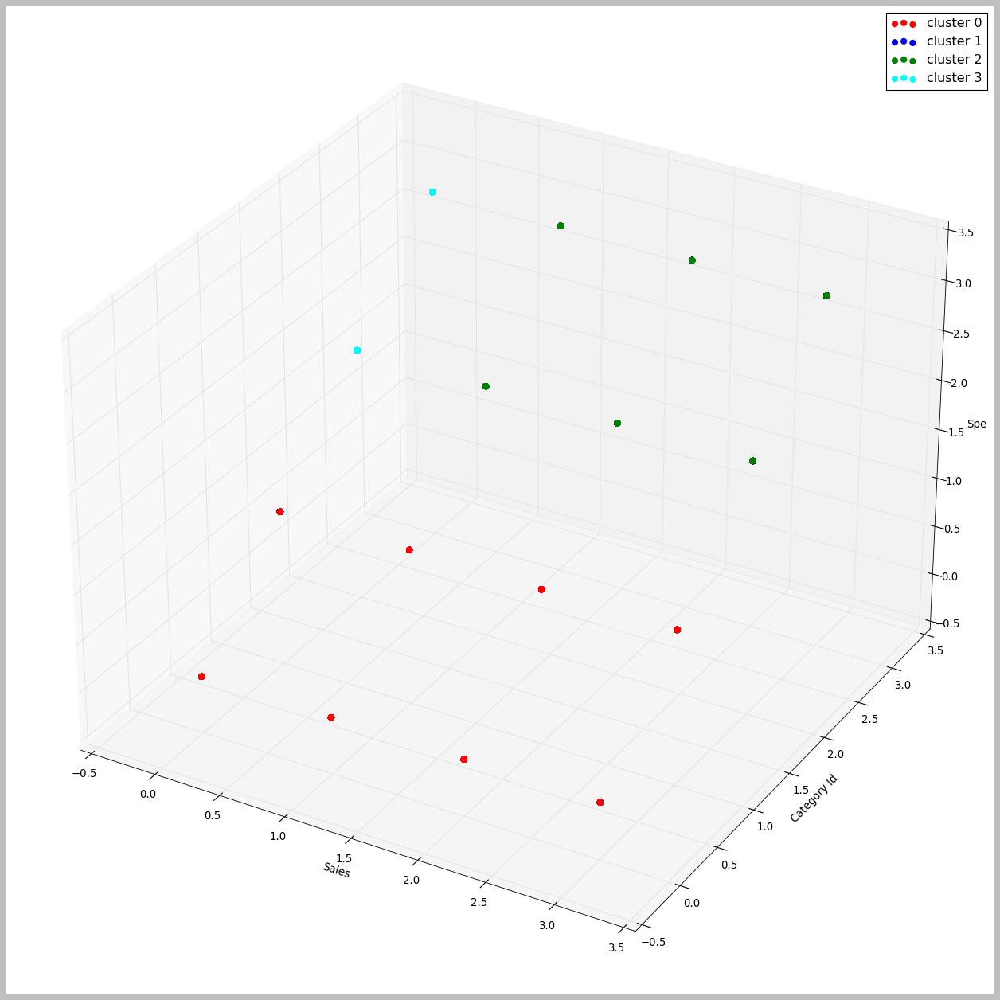

In [84]:
fig = plt.figure(figsize = (20,20))   # 3-D cluster for three features.
ax = fig.add_subplot(111, projection='3d')
ax.scatter(points[y_km == 0,0],points[y_km == 0,1],points[y_km == 0,1], s = 40 , color = 'red', label = "cluster 0")
ax.scatter(points[y_km == 1,0],points[y_km == 1,1],points[y_km == 1,1], s = 40 , color = 'blue', label = "cluster 1")
ax.scatter(points[y_km == 2,0],points[y_km == 2,1],points[y_km == 2,1], s = 40 , color = 'green', label = "cluster 2")
ax.scatter(points[y_km == 3,0],points[y_km == 3,1],points[y_km == 3,1], s = 40 , color = 'cyan', label = "cluster 3")
ax.set_xlabel('Sales')
ax.set_ylabel('Category Id')
ax.set_zlabel('Spe')
ax.legend()
plt.show()

In [85]:
# k means
kmeans = KMeans(n_clusters=3, random_state=0)
data['cluster'] = kmeans.fit_predict(data[[ 'Sales', 'Category Id']]) 
# get centroids
centroids = kmeans.cluster_centers_
cen_x = [i[0] for i in centroids] 
cen_y = [i[1] for i in centroids]
## add to df
data['cen_x'] = data.cluster.map({0:cen_x[0], 1:cen_x[1], 2:cen_x[2]})
data['cen_y'] = data.cluster.map({0:cen_y[0], 1:cen_y[1], 2:cen_y[2]})
# define and map colors
colors = ['#DF2020', '#81DF20', '#2095DF']
data['c'] = data.cluster.map({0:colors[0], 1:colors[1], 2:colors[2]})

C:\Users\rohan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


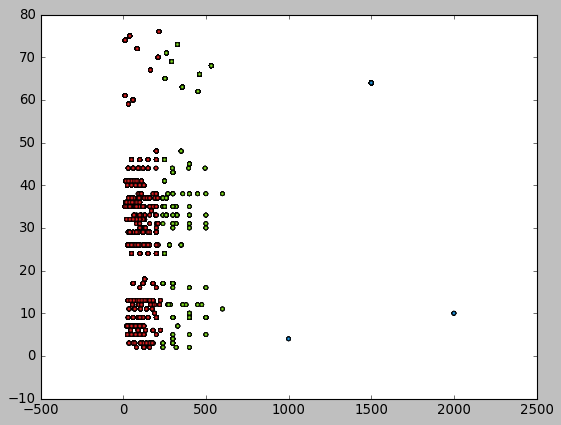

In [86]:
plt.scatter(data['Sales'],data['Category Id'],c = data.c, alpha = 0.6, s=10)

In [87]:
# k means
kmeans = KMeans(n_clusters=3, random_state=0)
data['cluster'] = kmeans.fit_predict(data[['Department Id', 'Category Id']]) 
# get centroids
centroids = kmeans.cluster_centers_
cen_x = [i[0] for i in centroids] 
cen_y = [i[1] for i in centroids]
## add to df
data['cen_x'] = data.cluster.map({0:cen_x[0], 1:cen_x[1], 2:cen_x[2]})
data['cen_y'] = data.cluster.map({0:cen_y[0], 1:cen_y[1], 2:cen_y[2]})
# define and map colors
colors = ['#DF2020', '#81DF20', '#2095DF']
data['c'] = data.cluster.map({0:colors[0], 1:colors[1], 2:colors[2]})

C:\Users\rohan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


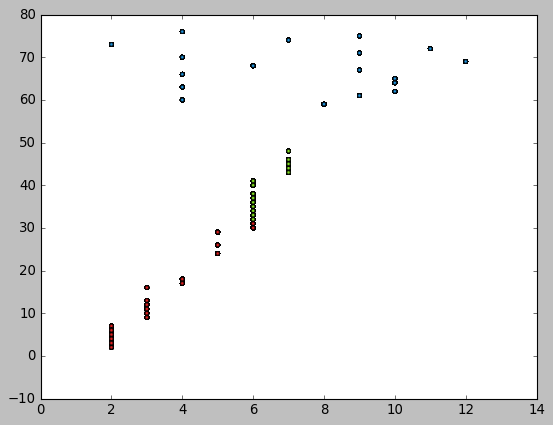

In [88]:
plt.scatter(data['Department Id'],data['Category Id'],c = data.c, alpha = 0.6, s=10)

C:\Users\rohan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


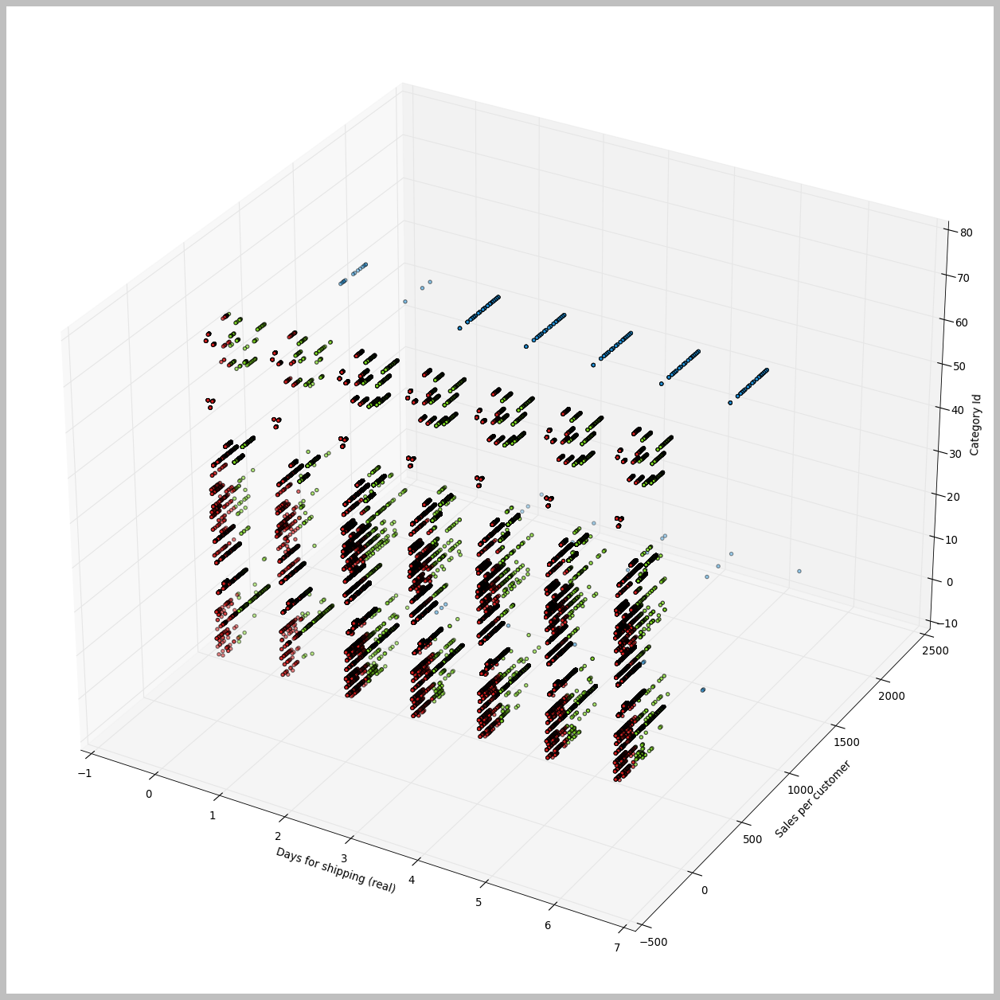

In [89]:
from mpl_toolkits.mplot3d import Axes3D
# %matplotlib widget
colors = ['#DF2020', '#81DF20', '#2095DF']
kmeans = KMeans(n_clusters=3, random_state=0)
data['cluster'] = kmeans.fit_predict(data[['Days for shipping (real)', 'Sales per customer', 'Category Id']])
data['c'] = data.cluster.map({0:colors[0], 1:colors[1], 2:colors[2]})
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data['Days for shipping (real)'], data['Sales per customer'], data['Category Id'], c=data.c, s=15)
ax.set_xlabel('Days for shipping (real)')
ax.set_ylabel('Sales per customer')
ax.set_zlabel('Category Id')
plt.show()